# Notebook showing a fast and efficient way to load Sentinel-2 L1C data into xarray

In [1]:
import glob
import os
import numpy as np

import pandas as pd
import geopandas as gpd
import xarray as xr

import matplotlib.pyplot as plt
import matplotlib as mpl
import cartopy.crs as ccrs
from matplotlib.colors import ListedColormap



import hvplot.xarray

import holoviews as hv
import holoviews.operation.datashader as hd
from holoviews import opts
hv.extension('bokeh')
#import geoviews
import datashader as ds
from datashader import transfer_functions as tf 
import colorcet as cc
import panel as pn
import panel.widgets as pnw
opts.defaults(
    opts.GridSpace(shared_xaxis=True, shared_yaxis=True),
    opts.Image(cmap='binary_r', width=800, height=700),
    opts.Labels(text_color='white', text_font_size='8pt', text_align='left', text_baseline='bottom'),
    opts.Path(color='white'),
    opts.Spread(width=900),
    opts.Overlay(show_legend=True))
# set the parameter for spectra extraction
import bokeh
pn.extension()

from s2driver import driver_S2_SAFE as S2
from s2driver import visual

import memory_profiler


%load_ext memory_profiler


opj = os.path.join


In [2]:

#import dask.distributed
#cluster = dask.distributed.LocalCluster()
#client = dask.distributed.Client(cluster)
#client

Set the path of the images you want to load, here is a example for the former (v3) and current (v4) image formatting 

In [3]:
imageSAFE_v3 = '/sat_data/satellite/sentinel2/L1C/31TFJ/S2A_MSIL1C_20201004T104031_N0209_R008_T31TFJ_20201004T125253.SAFE'
imageSAFE_v4 = '/sat_data/satellite/sentinel2/L1C/31TFJ/S2B_MSIL1C_20220731T103629_N0400_R008_T31TFJ_20220731T124834.SAFE'

First, check the availbale bands:

In [4]:
S2.INFO

bandId,0,1,2,3,4,5,6,7,8,9,10,11,12
ESA,B01,B02,B03,B04,B05,B06,B07,B08,B8A,B09,B10,B11,B12
EOREADER,CA,BLUE,GREEN,RED,VRE_1,VRE_2,VRE_3,NARROW_NIR,NIR,WV,SWIR_CIRRUS,SWIR_1,SWIR_2
Wavelength (nm),443,490,560,665,705,740,783,842,865,945,1375,1610,2190
Band width (nm),20,65,35,30,15,15,20,115,20,20,30,90,180
Resolution (m),60,10,10,10,20,20,20,10,20,60,60,20,20


Choose the bands to be loaded (fill the bandIds array up) and the resolution between 10, 20 and 60 m:

In [5]:
bandIds = [0,1,2,3,4,8,11,12]

resolution=20


Create the s2driver objects for the selected images

In [6]:
image = imageSAFE_v4
l1c = S2.s2image(image,band_idx=bandIds,resolution=resolution)
ESAbands = l1c.INFO.loc['ESA']
ESAbands.values

array(['B01', 'B02', 'B03', 'B04', 'B05', 'B8A', 'B11', 'B12'],
      dtype=object)

In [7]:
l1c.INFO


bandId,0,1,2,3,4,8,11,12
ESA,B01,B02,B03,B04,B05,B8A,B11,B12
EOREADER,CA,BLUE,GREEN,RED,VRE_1,NIR,SWIR_1,SWIR_2
Wavelength (nm),443,490,560,665,705,865,1610,2190
Band width (nm),20,65,35,30,15,20,90,180
Resolution (m),60,10,10,10,20,20,20,20


From that stage you can check some metadata such as the crs and geometry related attributes:

In [8]:
#pn.widgets.DataFrame(pd.DataFrame.from_dict(l1c.metadata.items()), frozen_columns=1, height=250,  autosize_mode='fit_viewport')

Load angles and get the *geom* xarray

In [9]:
#%time %memit l1c.load_geom()

Load band reflectances and get the *bands* xarray 


In [10]:
%time %memit l1c.load_bands()

peak memory: 5454.32 MiB, increment: 4990.19 MiB
CPU times: user 3min 48s, sys: 16.7 s, total: 4min 5s
Wall time: 49.1 s


/home/harmel/anaconda3/envs/grstbx/lib/python3.9/site-packages/xarray/core/common.py:615: FutureWarning: Updating MultiIndexed coordinate 'bandID' would corrupt indices for other variables: ['variable', 'band']. This will raise an error in the future. Use `.drop_vars({'variable', 'bandID', 'band'})` before assigning new coordinate values.
  data.coords.update(results)


# Plotting section
The MSI-Sentinel-2 instrument is composed of 12 detectors staggered in two different rows making a "switch" in viewng geometries along the image especially for the azimuth values. Here, we plot the solar and viewing zenith angles as well as the relative azimuth between Sun and sensor directions.
The sun viewing angle (SZA) is common to all the spectral bands.

Set 'reproject=True' to repoject raster into WGS 84 / Pseudo-Mercator for web mapping and visualization (e.g., OpenStreetMap). The EPSG code is 3857. 

In [11]:
h=visual.view_geo(l1c.bands,reproject=True)

In [13]:
h.colormaps = ['CET_D13', 'bky', 'CET_D1A','CET_CBL2','CET_L10','CET_C6s',
                          'kbc', 'blues_r', 'kb', 'rainbow', 'fire', 'kgy', 'bjy','gray' ]

In [14]:
h.visu()

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RadioButtonGroup(options=[0, 1, 2, 3, 4, 5, 6, 7], value=0)
                [1] Row
                    [0] Markdown(str)
                    [1] DatePicker(enabled_dates=[datetime.date(2022, ...], start=datetime.date(2022, ..., value=datetime.date(2022, ...)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CartoDark', ...], value='StamenTerrainRetina')
            [1] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RangeSlider(name='Range Slider', step=0.0001, value=(0, 0.5), value_end=0.5)
                [1] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
                [2] Row
                    [0] Markdown(str)
                    [1] Select(options=['CET_D13', 'bky', ...], value='CET_D13')
    [1] HoloViews(DynamicMap)

In [13]:
import holoviews as hv, holoviews.operation.datashader as hd, bokeh as bk, \
  rioxarray as rxr
import matplotlib, matplotlib.pyplot as plt, numpy as np
import os,  param, panel as pn

dataarrays, datasets, images, minmaxes = {}, {}, {}, {}

for iband,band in enumerate(bandIds):
  dataarrays[iband] =  l1c.bands[iband].rio.reproject('EPSG:3857')

In [14]:

image_width, image_height = 600, 600
map_width, map_height = 800, 600

key_dimensions = ['x', 'y']


import bokeh 
formatter_code = """
  var digits = 4;
  var projections = Bokeh.require("core/util/projections");
  var x = special_vars.x; var y = special_vars.y;
  var coords = projections.wgs84_mercator.invert(x, y);
  return "" + (Math.round(coords[%d] * 10**digits) / 10**digits).toFixed(digits)+ "";
"""
formatter_code_x, formatter_code_y = formatter_code % 0, formatter_code % 1
custom_tooltips = [ ('Lon', '@x{custom}'), ('Lat', '@y{custom}'), ('Value', '@image{0.0000}')]
custom_formatters = { 
  '@x' : bokeh.models.CustomJSHover(code=formatter_code_x), 
  '@y' : bokeh.models.CustomJSHover(code=formatter_code_y)
}
custom_hover = bokeh.models.HoverTool(tooltips=custom_tooltips, formatters=custom_formatters)


hv.opts.defaults(
  hv.opts.Image(height=image_height, width=image_width, 
                colorbar=True, tools=[custom_hover], active_tools=['wheel_zoom'], 
                clipping_colors={'NaN': '#00000000'}),
  hv.opts.Tiles(active_tools=['wheel_zoom'])
)
gopts = hv.opts.Tiles(xaxis=None, yaxis=None, bgcolor='black', show_grid=False)


tiles = hv.element.tiles.OSM().options(height=map_height, width=map_width).opts(gopts)

for iband,band in enumerate(bandIds):
    name=ESAbands.loc[band]
    datasets[name] = hv.Dataset(dataarrays[iband], vdims=name, kdims=key_dimensions)
    images[name] = hv.Image(datasets[name]).opts(gopts)
name=ESAbands.loc[bandIds[0]]  
min_val = float(datasets[name].data[name].quantile(0.1))
max_val = float(datasets[name].data[name].quantile(0.9))
minmaxes = (min_val, max_val)

In [15]:
pn_band = pn.widgets.RadioButtonGroup(options=list(ESAbands))
pn_colormap = pn.widgets.Select(
  options=['blues_r', 'kb', 'rainbow', 'fire', 'kgy'])
pn_opacity = pn.widgets.FloatSlider(name='Opacity', value=0.95, start=0, end=1, step=0.05) 
range_slider = pn.widgets.RangeSlider(
    name='Range Slider', start=0, end=1.2,value=minmaxes,step=0.0001)

@pn.depends(
  pn_band_value = pn_band.param.value, 
  pn_colormap_value = pn_colormap.param.value, 
  pn_opacity_value = pn_opacity.param.value,
  range_slider_value = range_slider.param.value
    
)
def load_map(pn_band_value, pn_colormap_value, pn_opacity_value,range_slider_value):
    image = images[pn_band_value]
  
    used_colormap = cc.cm[pn_colormap_value]
    
    image.opts(cmap=used_colormap, alpha=pn_opacity_value,clim=range_slider_value)
    return image

dynmap = hd.regrid(hv.DynamicMap(load_map))
combined = tiles * dynmap

pn.Column(
  pn.WidgetBox(
    '## S2 L1C', 
    pn.Column(pn.Row(
      pn.Row('#### Band', pn_band), 
      pn.Row('#### Colormap', pn_colormap), 
      pn.Row('#### Opacity', pn_opacity)
    ), pn.Row(range_slider))
      
  ), 
  combined
)

Column
    [0] WidgetBox
        [0] Markdown(str)
        [1] Column
            [0] Row
                [0] Row
                    [0] Markdown(str)
                    [1] RadioButtonGroup(options=['B01', 'B02', ...], value='B01')
                [1] Row
                    [0] Markdown(str)
                    [1] Select(options=['blues_r', 'kb', ...], value='blues_r')
                [2] Row
                    [0] Markdown(str)
                    [1] FloatSlider(name='Opacity', step=0.05, value=0.95)
            [1] Row
                [0] RangeSlider(end=1.2, name='Range Slider', step=0.0001, value=(0.10779999941587448, ..., value_end=0.15000000596046448, value_start=0.10779999941587448)
    [1] HoloViews(DynamicMap)

In [35]:
minmaxes

{'B01': (0.0, 0.1521600008010864),
 'B02': (0.0, 0.12497999668121337),
 'B03': (0.0, 0.11628000140190124),
 'B04': (0.0, 0.10616999566555023),
 'B8A': (0.0, 0.3200399994850159),
 'B12': (0.0, 0.13607999682426453)}

In [ ]:
hv.extension('bokeh', logo=False)
hv_tiles_osm = hv.element.tiles.OSM()

hv.extension('bokeh', logo=False)
# The * operator overlays multiple elements on each other
hv_combined_basic = hv_tiles_osm * hv_image_basic
hv_combined_basic.opts(title='first map')

In [15]:
coarsening = 10
p = l1c.geom.sza[::coarsening, ::coarsening].hvplot.image( project=True,crs=l1c.crs)
p

IndexError: array index out of range

The sensor angles are dependent on the spectral band considered, here are the viewing zenith angle (VZA) and the relative azimuth (RAZI) for the bands loaded in the S2 object.
## VZA

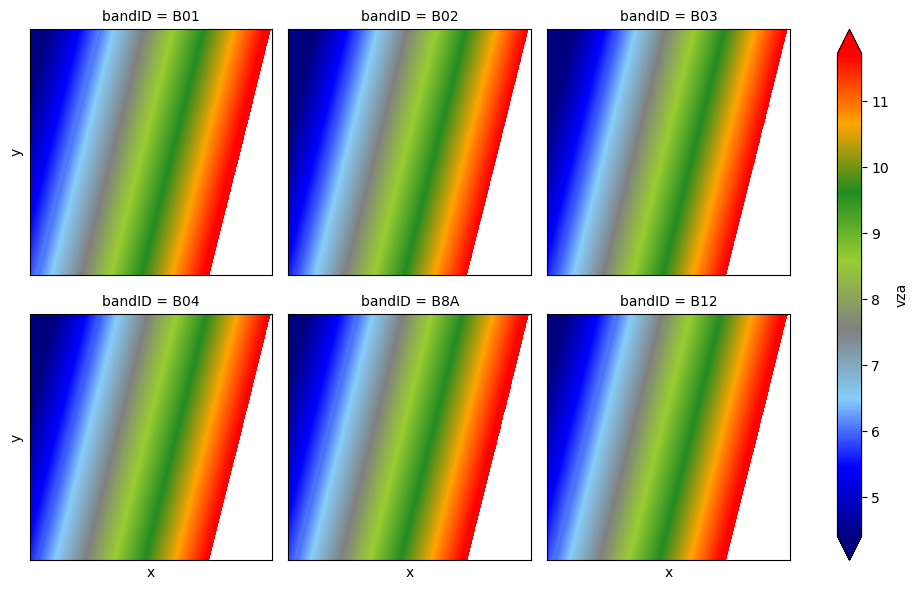

In [10]:
cmap = mpl.colors.LinearSegmentedColormap.from_list("",['navy', "blue", 'lightskyblue', 'gray', 'yellowgreen', 'forestgreen', 'orange', 'red'])
fig = l1c.geom.vza.plot.imshow(col='bandID', cmap=cmap, col_wrap=3,  robust=True,subplot_kws=dict(xlabel='',xticks=[], yticks=[]))

## RAZI

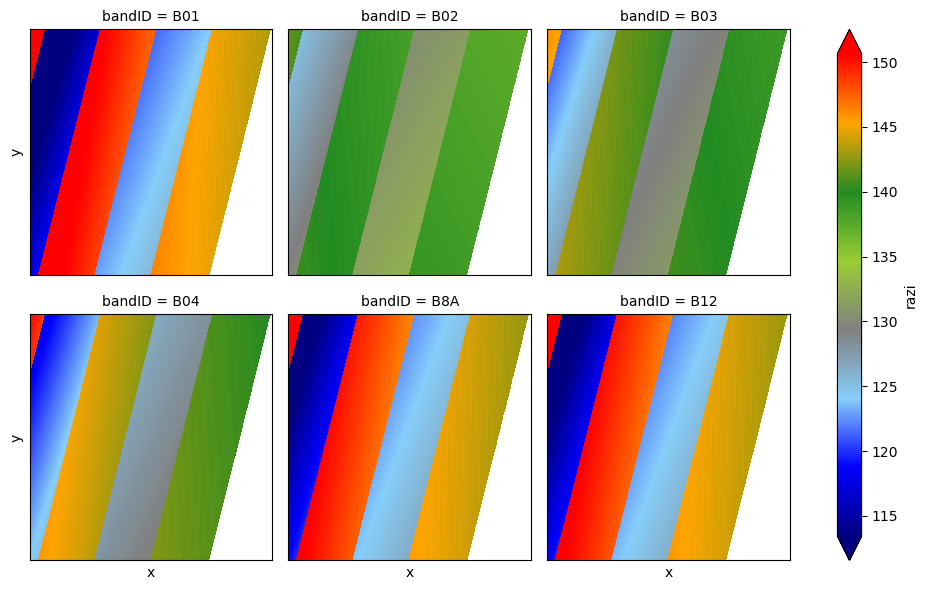

In [11]:
fig = l1c.geom.razi.plot.imshow(col='bandID', cmap=cmap, col_wrap=3, aspect=1, robust=True,subplot_kws=dict(xlabel='',xticks=[], yticks=[]))

Check the difference between two bands (e.g., B02-B8A)

In [12]:
diff = l1c.geom.sel(bandID='B02')-l1c.geom.sel(bandID='B8A')


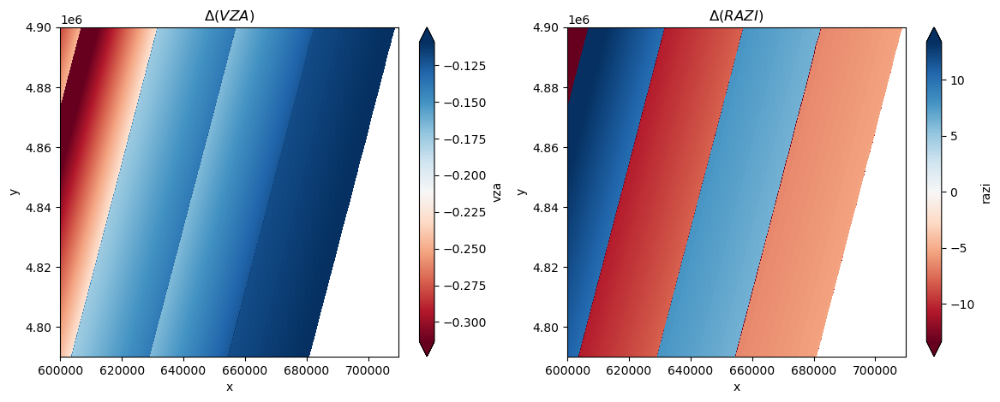

In [13]:
fig, axs = plt.subplots(ncols=2,figsize=(14,5))
diff.vza.plot.imshow(ax=axs[0],cmap=plt.cm.RdBu, robust=True)
axs[0].set_title('$\Delta (VZA)$')
diff.razi.plot.imshow(ax=axs[1],cmap=plt.cm.RdBu, robust=True)
axs[1].set_title('$\Delta (RAZI)$')
plt.show()

The reflectance data can also be easily plotted:

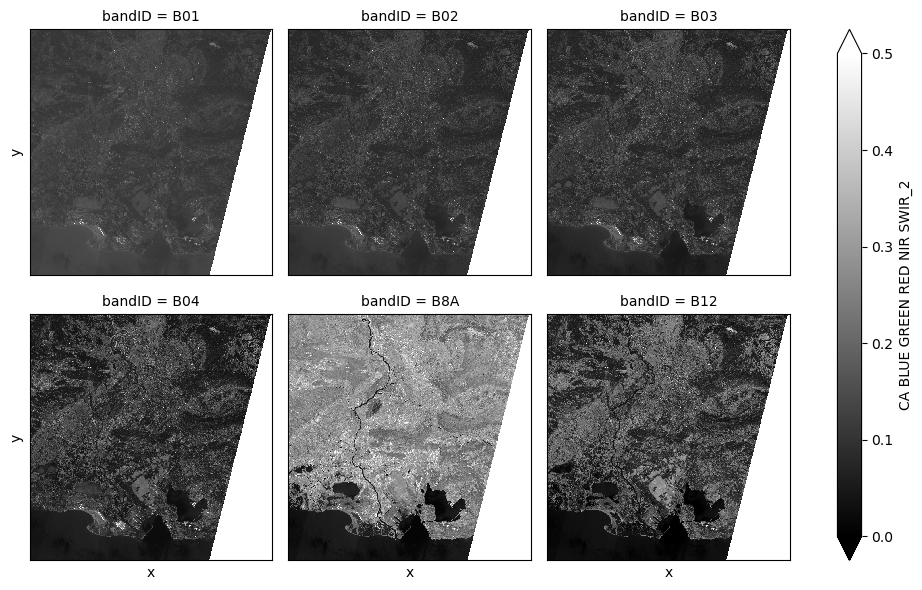

In [18]:

p = l1c.bands[:, ::coarsening, ::coarsening].plot.imshow(col='bandID', col_wrap=3,  vmin=0,vmax=0.5, cmap=plt.cm.binary_r,subplot_kws=dict(xlabel='',xticks=[], yticks=[]))

And the RGB image:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


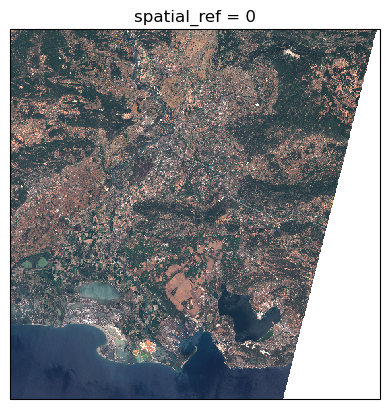

In [15]:
brightness_factor = 3.5
(l1c.bands[:, ::coarsening, ::coarsening].sel(bandID=['B04','B03','B02'])*brightness_factor).plot.imshow(rgb='bandID', subplot_kws=dict(projection= l1c.proj))

## Example of exploiation: compute NDWI for water pixel masking

In [16]:

# Compute NDWI
green = l1c.bands.sel(bandID='B03')
nir = l1c.bands.sel(bandID='B8A')
ndwi = (green - nir) / (green + nir)


def water_mask(ndwi, threshold=0):
    water = xr.where(ndwi > threshold, 1, 0)
    return water.where(~np.isnan(ndwi))


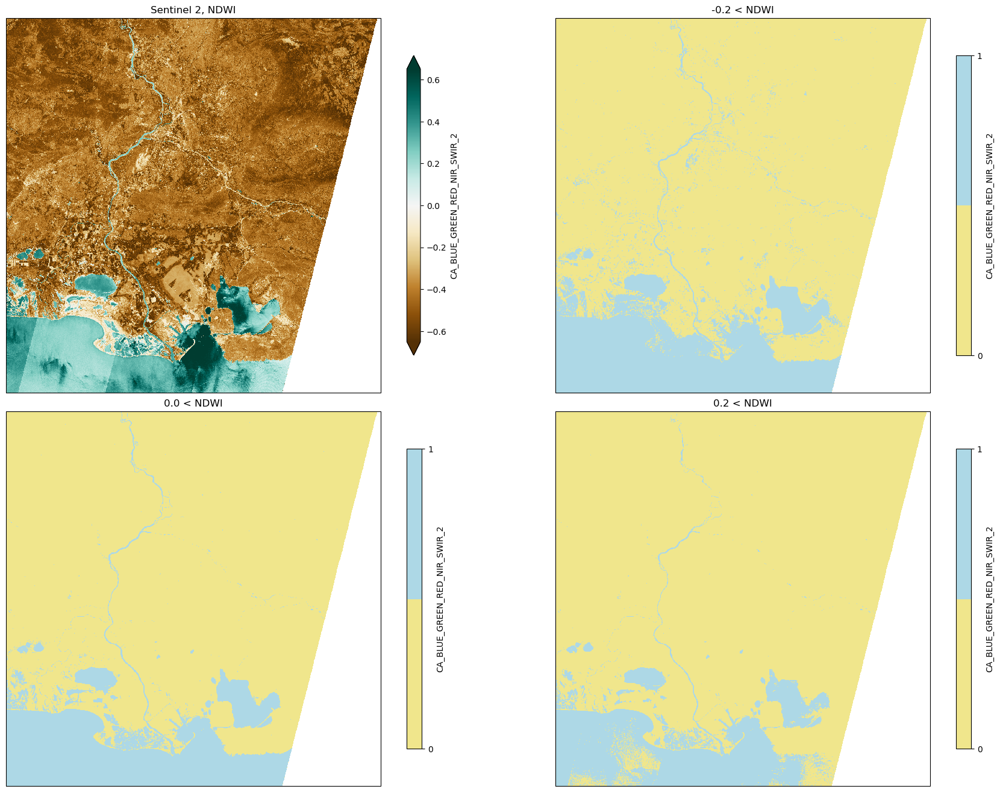

In [17]:
#coarsening to save memory and speed
coarsening=5
ndwi_ = ndwi[::coarsening, ::coarsening]

# Get geographic projection and bounds
extent = l1c.extent
proj = l1c.proj
bounds = extent.bounds
extent_val = [bounds.minx[0], bounds.maxx[0], bounds.miny[0], bounds.maxy[0]]

# binary cmap
bcmap = ListedColormap(['khaki', 'lightblue'])


def water_mask(ndwi, threshold=0):
    water = xr.where(ndwi > threshold, 1, 0)
    return water.where(~np.isnan(ndwi))

def plot_water_mask(ndwi,ax,threshold=0):
    water = water_mask(ndwi, threshold)
    ax.set_extent(extent_val, proj)
    water.plot.imshow(extent=extent_val, transform=proj, cmap=bcmap,
                                  cbar_kwargs={'ticks': [0, 1], 'shrink': shrink})
    ax.set_title(str(threshold)+' < NDWI')

fig = plt.figure(figsize=(20, 15))
fig.subplots_adjust(bottom=0.1, top=0.95, left=0.1, right=0.99,
                    hspace=0.05, wspace=0.05)
shrink = 0.8
    
ax = plt.subplot(2, 2, 1, projection=proj)
ax.set_extent(extent_val, proj)
fig = ndwi[::coarsening, ::coarsening].plot.imshow(extent=extent_val, transform=proj, cmap=plt.cm.BrBG, robust=True,
                                   cbar_kwargs={'shrink': shrink})
# axes.coastlines(resolution='10m',linewidth=1)
ax.set_title('Sentinel 2, NDWI')

for i,threshold in enumerate([-0.2,0.,0.2]):
    ax = plt.subplot(2, 2, i+2, projection=proj)
    plot_water_mask(ndwi_,ax,threshold=threshold)

plt.show()
